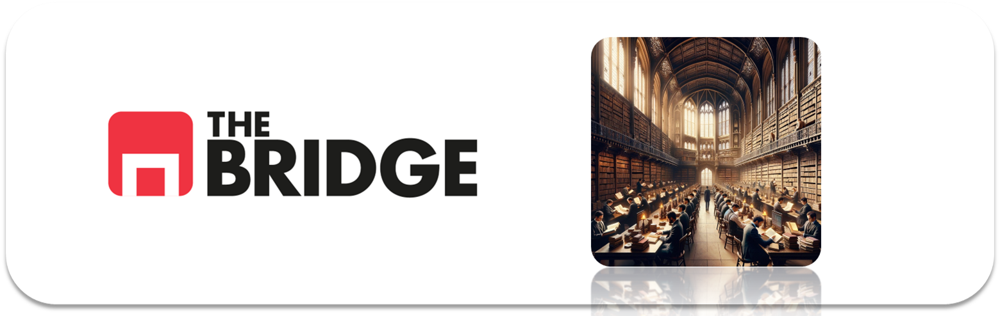

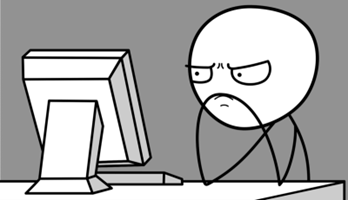

Para ejercitarte y afianzar lo aprendido sobre **NLP**, completa los siguientes ejercicios. Recuerda que necesitarás datos que están en el directorio data que acompaña al notebook (búscalo en el repositorio de ejercicios)
  
La solución a los mismos las tienes ya, intenta no mirarlos de primeras pero no dejes de hacerlo cuando hayas terminado por si te pudieran aportar.

## Twitter (now X) Sentiment Analysis
En este notebook vas a realizar un análisis de sentimientos sencillo sobre Tweets.

Estos programas son muy útiles en campañas de marketing, para monitorizar el lanzamiento de un nuevo producto, realizar seguimiento en Twitter de eventos, o simplemente tener monitorizadas ciertas cuentas o hashtags para tener un programa de análisis real time.

### Importa los datos

NOTA: Puedes descargártelos tal y como se muestra en la figura o bien emplear el fichero que hay en "data"

Vamos a utilizar un corpus de la [página del TASS](http://tass.sepln.org/tass_data/download.php), que se trata de una asociación de análisis semántico que encargada de recopilar texto y mantenerlo etiquetado.

![imagen](img/tass_register.png)

En este notebook se va a elegir un corpus genérico con no demasiados registros para aligerar la limpieza y entrenamiento de los modelos.

![imagen](img/download_train_spanish.png)

Lo ideal será siempre utilizar un corpus que sea afín a la temática que deseas predecir, por ejemplo si quieres monitorizar campañas de marketing, utiizar un corpus de texto que contenga comentarios acerca de la recepción a un determinado producto.

### Ejercicio 0

Importa los paquetes y módulos que necesites a lo largo del notebook

In [41]:
import numpy as np
import pandas as pd
import seaborn as sns
import xml.etree.ElementTree as ET
import re
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer

from sklearn.linear_model import LogisticRegression

### Ejercicio 1

Lee el dataset y conviértelo a un dataframe. Tendrás que recordar lo visto cuando procesamos ficheros XML, inténtalo sin ver la solución :-)

In [42]:
df= pd.read_xml("./data/general-train-tagged.xml", encoding = "utf8")
df

,tweetid,user,content,date,lang,sentiments,topics
0,142389495503925248,ccifuentes,"Salgo de #VeoTV , que día más largoooooo...",2011-12-02T00:47:55,es,\n,\n
1,142389933619945473,CarmendelRiego,@PauladeLasHeras No te libraras de ayudar me/n...,2011-12-02T00:49:40,es,\n,\n
2,142391947707940864,CarmendelRiego,@marodriguezb Gracias MAR,2011-12-02T00:57:40,es,\n,\n
3,142416095012339712,mgilguerrero,"Off pensando en el regalito Sinde, la que se v...",2011-12-02T02:33:37,es,\n,\n
4,142422495721562112,paurubio,Conozco a alguien q es adicto al drama! Ja ja ...,2011-12-02T02:59:03,es,\n,\n
...,...,...,...,...,...,...,...
7214,189809904935120896,mariviromero,Muy indignante si ...nadie repara en ello hoy ...,2012-04-10T22:19:42,es,\n,\n
7215,189814854503235584,mariviromero,Más pobres por discriminar a la mujer http://t...,2012-04-10T22:39:22,es,\n,\n
7216,189815389021143041,mariviromero,Crean un banco de productos para mujeres con c...,2012-04-10T22:41:30,es,\n,\n
7217,189824278827507712,Tonicanto1,Sobre la sorprendente huída hoy en el Senado d...,2012-04-10T23:16:49,es,\n,\n


In [43]:
with open("./data/general-train-tagged.xml", encoding = "utf8") as f:
    print(f.read())

<?xml version="1.0" encoding="UTF-8"?>
<tweets>
 <tweet>
  <tweetid>142389495503925248</tweetid>
  <user>ccifuentes</user>
  <content><![CDATA[Salgo de #VeoTV , que día más largoooooo...]]></content>
  <date>2011-12-02T00:47:55</date>
  <lang>es</lang>
  <sentiments>
   <polarity><value>NONE</value><type>AGREEMENT</type></polarity>
  </sentiments>
  <topics>
   <topic>otros</topic>
  </topics>
 </tweet>
 <tweet>
  <tweetid>142389933619945473</tweetid>
  <user>CarmendelRiego</user>
  <content><![CDATA[@PauladeLasHeras No te libraras de ayudar me/nos. Besos y gracias]]></content>
  <date>2011-12-02T00:49:40</date>
  <lang>es</lang>
  <sentiments>
   <polarity><value>NEU</value><type>DISAGREEMENT</type></polarity>
   <polarity><entity>@PauladeLasHeras</entity><value>NEU</value><type>DISAGREEMENT</type></polarity>
  </sentiments>
  <topics>
   <topic>otros</topic>
  </topics>
 </tweet>
 <tweet>
  <tweetid>142391947707940864</tweetid>
  <user>CarmendelRiego</user>
  <content><![CDATA[@marod

In [44]:
tree = ET.parse("./data/general-train-tagged.xml")
raiz = tree.getroot()
print(f"El nodo raiz es {raiz.tag}")

El nodo raiz es tweets


In [45]:
for nodo in raiz:
    print(nodo.tag, nodo.attrib)
    for hija in nodo:
        print("\t", hija.tag, hija.attrib, hija.text)
        for nieta in hija:
            print("\t","\t", nieta.tag, nieta.attrib, nieta.text)
            for bisnieta in nieta:
                print("\t","\t","\t", bisnieta.tag, bisnieta.attrib, bisnieta.text)
    print("*"*10,"\n")

tweet {}
	 tweetid {} 142389495503925248
	 user {} ccifuentes
	 content {} Salgo de #VeoTV , que día más largoooooo...
	 date {} 2011-12-02T00:47:55
	 lang {} es
	 sentiments {} 
   
	 	 polarity {} None
	 	 	 value {} NONE
	 	 	 type {} AGREEMENT
	 topics {} 
   
	 	 topic {} otros
********** 

tweet {}
	 tweetid {} 142389933619945473
	 user {} CarmendelRiego
	 content {} @PauladeLasHeras No te libraras de ayudar me/nos. Besos y gracias
	 date {} 2011-12-02T00:49:40
	 lang {} es
	 sentiments {} 
   
	 	 polarity {} None
	 	 	 value {} NEU
	 	 	 type {} DISAGREEMENT
	 	 polarity {} None
	 	 	 entity {} @PauladeLasHeras
	 	 	 value {} NEU
	 	 	 type {} DISAGREEMENT
	 topics {} 
   
	 	 topic {} otros
********** 

tweet {}
	 tweetid {} 142391947707940864
	 user {} CarmendelRiego
	 content {} @marodriguezb Gracias MAR
	 date {} 2011-12-02T00:57:40
	 lang {} es
	 sentiments {} 
   
	 	 polarity {} None
	 	 	 value {} P
	 	 	 type {} AGREEMENT
	 	 polarity {} None
	 	 	 entity {} @marodrigu

In [46]:
datos_dataframe = {
    "user": [],
    "content": [],
    "date": [],
    "lang": [],
    "polarity": [],
    "type":[]
}

for i in raiz.iter('tweet'):
    user = i.find('user').text
    content = i.find('content').text
    date = i.find('date').text
    lang = i.find('lang').text
    polarity = i.find('sentiments').find('polarity').find('value').text
    tweet_type = i.find('sentiments').find('polarity').find('type').text
    
    datos_dataframe['user'].append(user)
    datos_dataframe['content'].append(content)
    datos_dataframe['date'].append(date)
    datos_dataframe['lang'].append(lang)
    datos_dataframe['polarity'].append(polarity)
    datos_dataframe['type'].append(tweet_type)
    
df = pd.DataFrame(datos_dataframe)
print(df.shape)

(7219, 6)


### Ejercicio 2

Echa un vistazo al dataset. ¿Cuál crees que podría ser el target?

In [47]:
df.head()

,user,content,date,lang,polarity,type
0,ccifuentes,"Salgo de #VeoTV , que día más largoooooo...",2011-12-02T00:47:55,es,NONE,AGREEMENT
1,CarmendelRiego,@PauladeLasHeras No te libraras de ayudar me/n...,2011-12-02T00:49:40,es,NEU,DISAGREEMENT
2,CarmendelRiego,@marodriguezb Gracias MAR,2011-12-02T00:57:40,es,P,AGREEMENT
3,mgilguerrero,"Off pensando en el regalito Sinde, la que se v...",2011-12-02T02:33:37,es,N+,AGREEMENT
4,paurubio,Conozco a alguien q es adicto al drama! Ja ja ...,2011-12-02T02:59:03,es,P+,AGREEMENT


In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7219 entries, 0 to 7218
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   user      7219 non-null   object
 1   content   7218 non-null   object
 2   date      7219 non-null   object
 3   lang      7219 non-null   object
 4   polarity  7219 non-null   object
 5   type      7219 non-null   object
dtypes: object(6)
memory usage: 338.5+ KB


In [49]:
df.dropna(inplace=True)

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7218 entries, 0 to 7218
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   user      7218 non-null   object
 1   content   7218 non-null   object
 2   date      7218 non-null   object
 3   lang      7218 non-null   object
 4   polarity  7218 non-null   object
 5   type      7218 non-null   object
dtypes: object(6)
memory usage: 394.7+ KB


- El target sería type

### Ejercicio 3

Existe una columna de polaridad que será la que empleemos como target. Por simplicidad, queremos predecir simplemente si son comentarios positivos o negativos. Transforma el target en dos clases agrupando, ¿Qué deberíamos hacer con los comentarios neutrales o sin polaridad?

In [51]:
target = "polarity"

<Axes: xlabel='polarity', ylabel='count'>

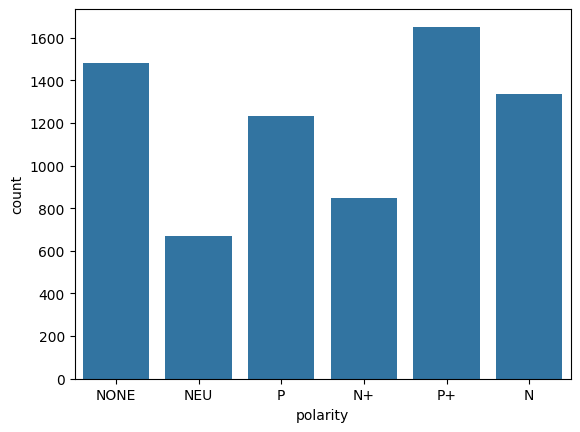

In [52]:
sns.countplot(df,x= target)

In [53]:
df.polarity.value_counts()

polarity
P+      1652
NONE    1482
N       1335
P       1232
N+       847
NEU      670
Name: count, dtype: int64

In [54]:
df.polarity.replace({"N+":"N","P+":"P"},inplace = True)

In [56]:
df.polarity.replace({"N":0,"P":1},inplace = True)

In [57]:
df= df[(df["polarity"]!= "NONE" ) & (df["polarity"]!= "NEU" )] 
df["polarity"] = df["polarity"].astype(int)

In [58]:
df.head()

,user,content,date,lang,polarity,type
2,CarmendelRiego,@marodriguezb Gracias MAR,2011-12-02T00:57:40,es,1,AGREEMENT
3,mgilguerrero,"Off pensando en el regalito Sinde, la que se v...",2011-12-02T02:33:37,es,0,AGREEMENT
4,paurubio,Conozco a alguien q es adicto al drama! Ja ja ...,2011-12-02T02:59:03,es,1,AGREEMENT
6,Carlos_Latre,Toca @crackoviadeTV3 . Grabación dl especial N...,2011-12-02T07:00:50,es,1,AGREEMENT
8,nacho_uriarte,Buen día todos! Lo primero mandar un abrazo gr...,2011-12-02T07:45:05,es,1,AGREEMENT


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5066 entries, 2 to 7218
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   user      5066 non-null   object
 1   content   5066 non-null   object
 2   date      5066 non-null   object
 3   lang      5066 non-null   object
 4   polarity  5066 non-null   int32 
 5   type      5066 non-null   object
dtypes: int32(1), object(5)
memory usage: 257.3+ KB


### Ejercicio 4

Continuando con la limpieza, elimina las filas que no están en español (1) y elimina la columna. Elimina también los duplicados.

In [60]:
df.lang.unique()

array(['es'], dtype=object)

In [61]:
df.drop(columns= "lang", inplace=True)

In [62]:
df.drop_duplicates(subset = 'content', inplace=True)


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5052 entries, 2 to 7218
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   user      5052 non-null   object
 1   content   5052 non-null   object
 2   date      5052 non-null   object
 3   polarity  5052 non-null   int32 
 4   type      5052 non-null   object
dtypes: int32(1), object(4)
memory usage: 217.1+ KB


### Ejercicio 5: Limpieza NLP (I)

Elimina signos de puntuación (puntos, comas, interrogaciones, paréntesis) (NOTA: Esta limpieza la haríamos sobre test de igual forma y no depende de los valores agregados o específico de test, por lo que se puede hacer antes del split)

In [64]:
REPLACE_NO_SPACE = re.compile("(\.)|(\,)|(\;)|(\:)|(\!)|(\¡)|(\¿)|(\?)|(\,)|(\")|(\()|(\))|(\[)|(\])|(\@)|(\#)|(\d+)") 
REPLACE_WITH_SPACE = re.compile("(<br \s*/><br\s*/>)|(\-)|(\/)|(_)")
NO_SPACE = ""
SPACE = " "


def clean(row):
    
    dato = REPLACE_NO_SPACE.sub(NO_SPACE, row.lower()) 
    
    dato = REPLACE_WITH_SPACE.sub(SPACE, dato) 
    dato = " ".join([word for word in dato.split() if "http" not in word])

    return dato


In [65]:
df["tweet_limpio"] = df["content"].apply(clean)


In [66]:
df["tweet_limpio"]

2                                marodriguezb gracias mar
3       off pensando en el regalito sinde la que se va...
4       conozco a alguien q es adicto al drama ja ja j...
6       toca crackoviadetv grabación dl especial navid...
8       buen día todos lo primero mandar un abrazo gra...
                              ...                        
7214    muy indignante si nadie repara en ello hoy aqu...
7215      más pobres por discriminar a la mujer tco tuzlh
7216    crean un banco de productos para mujeres con c...
7217    sobre la sorprendente huída hoy en el senado d...
7218    corremarianocorre está muy bien pero la versió...
Name: tweet_limpio, Length: 5052, dtype: object

### Ejercicio 6: Limpieza NLP (II)

Elimina los links

### Ejercicio 7: Limpieza NLP (III)

Elimina stopwords, apoyate en el diccionario de stopwords de español de Nltk.

In [67]:
dictionary = stopwords.words("spanish")
def remove_stopwords(row):
    dato = " ".join([word for word in row.split(" ") if word not in dictionary])
    return dato

In [68]:
df["tweet_limpio_sin_stopwords"] = df["tweet_limpio"].apply(remove_stopwords)

In [69]:
df["tweet_limpio_sin_stopwords"]

2                                marodriguezb gracias mar
3       off pensando regalito sinde va sgae van corrup...
4         conozco alguien q adicto drama ja ja ja suena d
6       toca crackoviadetv grabación dl especial navid...
8       buen día primero mandar abrazo grande miguel f...
                              ...                        
7214    indignante si nadie repara ello hoy aqui graci...
7215                   pobres discriminar mujer tco tuzlh
7216    crean banco productos mujeres cáncer mama tco ...
7217     sorprendente huída hoy senado rajoy tco nbmvkhqp
7218    corremarianocorre bien versión gallega correma...
Name: tweet_limpio_sin_stopwords, Length: 5052, dtype: object

In [70]:
df

,user,content,date,polarity,type,tweet_limpio,tweet_limpio_sin_stopwords
2,CarmendelRiego,@marodriguezb Gracias MAR,2011-12-02T00:57:40,1,AGREEMENT,marodriguezb gracias mar,marodriguezb gracias mar
3,mgilguerrero,"Off pensando en el regalito Sinde, la que se v...",2011-12-02T02:33:37,0,AGREEMENT,off pensando en el regalito sinde la que se va...,off pensando regalito sinde va sgae van corrup...
4,paurubio,Conozco a alguien q es adicto al drama! Ja ja ...,2011-12-02T02:59:03,1,AGREEMENT,conozco a alguien q es adicto al drama ja ja j...,conozco alguien q adicto drama ja ja ja suena d
6,Carlos_Latre,Toca @crackoviadeTV3 . Grabación dl especial N...,2011-12-02T07:00:50,1,AGREEMENT,toca crackoviadetv grabación dl especial navid...,toca crackoviadetv grabación dl especial navid...
8,nacho_uriarte,Buen día todos! Lo primero mandar un abrazo gr...,2011-12-02T07:45:05,1,AGREEMENT,buen día todos lo primero mandar un abrazo gra...,buen día primero mandar abrazo grande miguel f...
...,...,...,...,...,...,...,...
7214,mariviromero,Muy indignante si ...nadie repara en ello hoy ...,2012-04-10T22:19:42,0,AGREEMENT,muy indignante si nadie repara en ello hoy aqu...,indignante si nadie repara ello hoy aqui graci...
7215,mariviromero,Más pobres por discriminar a la mujer http://t...,2012-04-10T22:39:22,0,AGREEMENT,más pobres por discriminar a la mujer tco tuzlh,pobres discriminar mujer tco tuzlh
7216,mariviromero,Crean un banco de productos para mujeres con c...,2012-04-10T22:41:30,1,AGREEMENT,crean un banco de productos para mujeres con c...,crean banco productos mujeres cáncer mama tco ...
7217,Tonicanto1,Sobre la sorprendente huída hoy en el Senado d...,2012-04-10T23:16:49,0,AGREEMENT,sobre la sorprendente huída hoy en el senado d...,sorprendente huída hoy senado rajoy tco nbmvkhqp


### Ejercicio 8:

Aplica un stemmer guardando el resultado en una columna nueva, no pierdas la resultante de todas las limpiezas anteriores.

In [71]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer('spanish')
def stemming_eng(row):
    return stemmer.stem(row)

In [72]:
df["tweet_stemmed"] = df["tweet_limpio_sin_stopwords"].apply(stemming_eng)

### Ejercicio 9

Crea dos dataframes. Uno con la columna obtenida en el ejercicio 7 y el target, otro con la columna obtenida en el ejercicio 8 y el target.

In [73]:
df_7= df[["tweet_limpio_sin_stopwords","polarity"]].copy()
df_8= df[["tweet_stemmed","polarity"]].copy()

### Ejercicio 10: Train y Test

En esta ocasión hemos retrasado el split, podríamos haberlo hecho mucho antes, pero no afecta porque la limpieza hasta ahora no tenía en cuenta valores agregados y sería la misma en uno y otro dataset. Pero ahora crea el train y test para ambos dataframes. Muestra la distribución del target.


In [74]:
train_set_7, test_set_7 = train_test_split(df_7, test_size = 0.2, random_state = 73)
train_set_8, test_set_8 = train_test_split(df_8, test_size = 0.2, random_state = 73)

### Ejercicio 11: Vectorizacion BoW no binaria.

Vectoriza las columnas de texto de los dataframes del ejercicio anterior con un BoW no binario, usando CountVectorizer (limita el vocabulario a 10000 tokens, los más ). No deshagas las matrices dispersas.

In [89]:
vectorizer_7 = CountVectorizer(binary=True, max_features = 10000) 
vectorizer_8 = CountVectorizer(binary=True, max_features = 10000) 

X_train_7 = vectorizer_7.fit_transform(train_set_7["tweet_limpio_sin_stopwords"]) 
X_test_7 = vectorizer_7.transform(test_set_7["tweet_limpio_sin_stopwords"]) 

X_train_8= vectorizer_8.fit_transform(train_set_8["tweet_stemmed"]) 
X_test_8 = vectorizer_8.transform(test_set_8["tweet_stemmed"]) 


In [90]:
y_train = train_set_7[target]
y_test = test_set_7[target]

### Ejercicio 12:

Escoge un modelo sencillo para hacer el entrenamiento en cada uno de los dos datasets (sin stemmer y con stemmer). Entrenalos ajustando sus hiperparámetros a la vez y compara sus resultados contra test.

In [91]:
lr_clf_7= LogisticRegression(max_iter=10000)

param_grid_7 = {
    "C": [0.1,0.2,0.6,1,5],
    "class_weight": ["balanced", None]
}

lr_grid_7 = GridSearchCV(lr_clf_7,
                       param_grid = param_grid_7,
                       cv = 5,
                       scoring = "accuracy"
                      )

lr_grid_7.fit(X_train_7, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=10000),
             param_grid={'C': [0.1, 0.2, 0.6, 1, 5],
                         'class_weight': ['balanced', None]},
             scoring='accuracy')

In [92]:
y_pred_7= lr_grid_7.predict(X_test_7)
print(classification_report(y_test, y_pred_7))

              precision    recall  f1-score   support

           0       0.75      0.77      0.76       434
           1       0.82      0.81      0.81       577

    accuracy                           0.79      1011
   macro avg       0.79      0.79      0.79      1011
weighted avg       0.79      0.79      0.79      1011



In [93]:
lr_clf_8= LogisticRegression(max_iter=10000)

param_grid_8 = {
    "C": [0.1,0.2,0.6,1,5],
    "class_weight": ["balanced", None]
}

lr_grid_8 = GridSearchCV(lr_clf_8,
                       param_grid = param_grid_8,
                       cv = 5,
                       scoring = "accuracy"
                      )

lr_grid_8.fit(X_train_8, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(max_iter=10000),
             param_grid={'C': [0.1, 0.2, 0.6, 1, 5],
                         'class_weight': ['balanced', None]},
             scoring='accuracy')

In [94]:
y_pred_8 = lr_grid_8.predict(X_test_8)
print(classification_report(y_test, y_pred_8))

              precision    recall  f1-score   support

           0       0.72      0.77      0.75       434
           1       0.82      0.77      0.80       577

    accuracy                           0.77      1011
   macro avg       0.77      0.77      0.77      1011
weighted avg       0.78      0.77      0.77      1011



### Ejercicio 13

Realiza un pequeño análisis de resultados, pega la predicción al  train de test del mejor de los datasets anteriores y comprueba 3 tuists acertados y 3 tuist no acertados, leyendo el texto, piensa la polaridad que le darías (Negatia o Positiva) y luego comprueba el target y la predicción.